# Capstone Two: Chicago Education Performance

## Step One : Data Wrangling 

#### We will first import all the packages needed to clean our data and then we will load our data!

In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
plt.close("all")

In [2]:
school_data = pd.read_csv('chigago_schools_progress_reports.csv')

In [3]:
print(school_data)

     School ID                                     Name of School  \
0       610038                  Abraham Lincoln Elementary School   
1       610281  Adam Clayton Powell Paideia Community Academy ...   
2       610185                Adlai E Stevenson Elementary School   
3       609993                    Agustin Lara Elementary Academy   
4       610513                      Air Force Academy High School   
..         ...                                                ...   
561     610172                William T Sherman Elementary School   
562     609844                 William W Carter Elementary School   
563     610088                Wolfgang A Mozart Elementary School   
564     609977               Woodlawn Community Elementary School   
565     610392                 World Language Academy High School   

    Elementary, Middle, or High School          Street Address     City  \
0                                   ES        615 W Kemper Pl   Chicago   
1                    

#### We have 566 schools we will exam and 64 school features in our dataframe. Lets take a look at what infomation we can obtain from our the features in our dataframe.

In [4]:
school_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 64 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   School ID                                          566 non-null    int64  
 1   Name of School                                     566 non-null    object 
 2   Elementary, Middle, or High School                 566 non-null    object 
 3   Street Address                                     566 non-null    object 
 4   City                                               566 non-null    object 
 5   ZIP Code                                           566 non-null    int64  
 6   Network Manager                                    566 non-null    object 
 7   Collaborative Name                                 566 non-null    object 
 8   Adequate Yearly Progress Made?                     566 non-null    object 
 9   CPS Perfor

#### We have 64 features about the 566 schools in chicago. These features speak to the students performance in school. We see some of the students performance on average in Grade Level Math, Grade Level Reading, Algebra. We also see the performance in other factors that effect students success in school; parent involvement, teachers score, students performance, and safety score.

#### With these features in mind the question of what features and grade level will be model. 

In [5]:
school_data.apply(pd.to_numeric, errors='ignore').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 64 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   School ID                                          566 non-null    int64  
 1   Name of School                                     566 non-null    object 
 2   Elementary, Middle, or High School                 566 non-null    object 
 3   Street Address                                     566 non-null    object 
 4   City                                               566 non-null    object 
 5   ZIP Code                                           566 non-null    int64  
 6   Network Manager                                    566 non-null    object 
 7   Collaborative Name                                 566 non-null    object 
 8   Adequate Yearly Progress Made?                     566 non-null    object 
 9   CPS Perfor

In [6]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,...,Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %,Latitude,Longitude
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,813,33,NDA,41.924497,-87.644522
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,521,46,NDA,41.760324,-87.556736
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,1324,44,NDA,41.747111,-87.731702
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,556,42,NDA,41.809757,-87.672145
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,NDA,Not on Probation,...,1.4,NDA,NDA,NDA,NDA,302,40,91.8,41.828146,-87.632794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561,610172,William T Sherman Elementary School,ES,1000 W 52nd St,Chicago,60609,AUSL Schools,SOUTHWEST SIDE COLLABORATIVE,No,Probation,...,NDA,NDA,NDA,NDA,NDA,462,45,NDA,41.799788,-87.650255
562,609844,William W Carter Elementary School,ES,5740 S Michigan Ave,Chicago,60637,Burnham Park Elementary Network,SOUTH SIDE COLLABORATIVE,No,Probation,...,NDA,NDA,NDA,NDA,NDA,371,42,NDA,41.789841,-87.622490
563,610088,Wolfgang A Mozart Elementary School,ES,2200 N Hamlin Ave,Chicago,60647,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,748,34,NDA,41.920927,-87.721925
564,609977,Woodlawn Community Elementary School,ES,6657 S Kimbark Ave,Chicago,60637,Burnham Park Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,238,46,NDA,41.773400,-87.594356


In [7]:
school_data.head()

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,...,Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %,Latitude,Longitude
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,813,33,NDA,41.924497,-87.644522
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,521,46,NDA,41.760324,-87.556736
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,1324,44,NDA,41.747111,-87.731702
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,556,42,NDA,41.809757,-87.672145
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,NDA,Not on Probation,...,1.4,NDA,NDA,NDA,NDA,302,40,91.8,41.828146,-87.632794


In [8]:
school_data.tail()

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,...,Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %,Latitude,Longitude
561,610172,William T Sherman Elementary School,ES,1000 W 52nd St,Chicago,60609,AUSL Schools,SOUTHWEST SIDE COLLABORATIVE,No,Probation,...,NDA,NDA,NDA,NDA,NDA,462,45,NDA,41.799788,-87.650255
562,609844,William W Carter Elementary School,ES,5740 S Michigan Ave,Chicago,60637,Burnham Park Elementary Network,SOUTH SIDE COLLABORATIVE,No,Probation,...,NDA,NDA,NDA,NDA,NDA,371,42,NDA,41.789841,-87.622490
563,610088,Wolfgang A Mozart Elementary School,ES,2200 N Hamlin Ave,Chicago,60647,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,748,34,NDA,41.920927,-87.721925
564,609977,Woodlawn Community Elementary School,ES,6657 S Kimbark Ave,Chicago,60637,Burnham Park Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,238,46,NDA,41.773400,-87.594356
565,610392,World Language Academy High School,HS,3120 S Kostner Ave,Chicago,60623,West Side High School Network,WEST SIDE COLLABORATIVE,No,Not on Probation,...,1.2,16.2,14.6,69.4,48.1,382,37,76,41.836020,-87.734195


In [9]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,...,Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %,Latitude,Longitude
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,813,33,NDA,41.924497,-87.644522
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,521,46,NDA,41.760324,-87.556736
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,1324,44,NDA,41.747111,-87.731702
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,556,42,NDA,41.809757,-87.672145
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,NDA,Not on Probation,...,1.4,NDA,NDA,NDA,NDA,302,40,91.8,41.828146,-87.632794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561,610172,William T Sherman Elementary School,ES,1000 W 52nd St,Chicago,60609,AUSL Schools,SOUTHWEST SIDE COLLABORATIVE,No,Probation,...,NDA,NDA,NDA,NDA,NDA,462,45,NDA,41.799788,-87.650255
562,609844,William W Carter Elementary School,ES,5740 S Michigan Ave,Chicago,60637,Burnham Park Elementary Network,SOUTH SIDE COLLABORATIVE,No,Probation,...,NDA,NDA,NDA,NDA,NDA,371,42,NDA,41.789841,-87.622490
563,610088,Wolfgang A Mozart Elementary School,ES,2200 N Hamlin Ave,Chicago,60647,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,748,34,NDA,41.920927,-87.721925
564,609977,Woodlawn Community Elementary School,ES,6657 S Kimbark Ave,Chicago,60637,Burnham Park Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,...,NDA,NDA,NDA,NDA,NDA,238,46,NDA,41.773400,-87.594356


In [10]:
pd.set_option('display.max_columns', None) #Lets see all the columns of the dataset 
pd.set_option('display.max_rows', None)

In [11]:
missing = pd.concat([school_data.isnull().sum(), 100 * school_data.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending = True)


,count,%
School ID,0,0.000000
Gr3-5 Grade Level Math %,0,0.000000
Gr3-5 Grade Level Read %,0,0.000000
Gr3-5 Keep Pace Read %,0,0.000000
Gr3-5 Keep Pace Math %,0,0.000000
Gr6-8 Grade Level Math %,0,0.000000
Gr6-8 Grade Level Read %,0,0.000000
Gr6-8 Keep Pace Math%,0,0.000000
Gr6-8 Keep Pace Read %,0,0.000000
Gr-8 Explore Math %,0,0.000000


In [12]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),10th Grade PLAN (2010),Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %,Latitude,Longitude
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,Yes,Very Strong,99.0,Very Strong,99,Strong,74.0,Strong,66.0,Strong,Strong,70,Strong,56,Average,47,96.00%,1.0,96.40%,95.80%,80.1,43.3,89.6,84.9,60.7,62.6,81.9,85.2,52,62.4,66.3,77.9,69.7,64.4,0.2,0.9,Yellow,Green,67.1,54.5,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,813,33,NDA,41.924497,-87.644522
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,No,Average,54.0,Strong,66,Strong,74.0,Very Strong,84.0,Strong,Strong,76,Weak,46,Average,50,95.60%,15.7,95.30%,100.00%,62.4,51.7,21.9,15.1,29,42.8,38.5,27.4,44.8,42.7,14.1,34.4,16.8,16.5,0.7,1.4,Green,Green,17.2,27.3,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,521,46,NDA,41.760324,-87.556736
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Strong,61.0,NDA,NDA,Average,50.0,Weak,36.0,NDA,NDA,NDA,Average,47,Weak,41,95.70%,2.3,94.70%,98.30%,53.7,26.6,38.3,34.7,43.7,57.3,48.8,39.2,46.8,44,7.5,21.9,18.3,15.5,-0.9,-1.0,Red,Red,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,1324,44,NDA,41.747111,-87.731702
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Average,56.0,Average,44,Average,45.0,Weak,37.0,Strong,Average,48,Average,53,Strong,58,95.50%,10.4,95.80%,100.00%,76.9,NDA,26,24.7,61.8,49.7,39.2,27.2,69.7,60.6,9.1,18.2,11.1,9.6,0.9,2.4,Green,Green,42.9,25,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,556,42,NDA,41.809757,-87.672145
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,NDA,Not on Probation,Yes,Average,49.0,Strong,60,Strong,60.0,Average,55.0,Average,Average,54,Average,53,Average,49,93.30%,15.6,96.90%,100.00%,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NaN,NaN,NaN,NaN,NDA,NDA,NDA,NDA,14.6,14.8,NDA,16,1.4,NDA,NDA,NDA,NDA,302,40,91.8,41.828146,-87.632794
5,610212,Albany Park Multicultural Academy,MS,4929 N Sawyer Ave,Chicago,60625,O'Hare Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Strong,66.0,Weak,37,Strong,66.0,Strong,71.0,Average,Average,50,Weak,46,Average,51,97.00%,2.3,96.90%,100.00%,NDA,NDA,NDA,NDA,NDA,NDA,60.7,39.8,53.7,59.8,17.5,20.8,34.5,15.6,0.2,0.3,Yellow,Yellow,29.2,50,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,2

In [13]:
school_data = school_data.drop(columns = ['Latitude','Longitude'])

In [14]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),10th Grade PLAN (2010),Net Change EXPLORE and PLAN,11th Grade Average ACT (2011),College Eligibility %,Graduation Rate %,College Enrollment Rate %,College Enrollment (number of students),General Services Route,Freshman on Track Rate %
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,Yes,Very Strong,99.0,Very Strong,99,Strong,74.0,Strong,66.0,Strong,Strong,70,Strong,56,Average,47,96.00%,1.0,96.40%,95.80%,80.1,43.3,89.6,84.9,60.7,62.6,81.9,85.2,52,62.4,66.3,77.9,69.7,64.4,0.2,0.9,Yellow,Green,67.1,54.5,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,813,33,NDA
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,No,Average,54.0,Strong,66,Strong,74.0,Very Strong,84.0,Strong,Strong,76,Weak,46,Average,50,95.60%,15.7,95.30%,100.00%,62.4,51.7,21.9,15.1,29,42.8,38.5,27.4,44.8,42.7,14.1,34.4,16.8,16.5,0.7,1.4,Green,Green,17.2,27.3,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,521,46,NDA
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Strong,61.0,NDA,NDA,Average,50.0,Weak,36.0,NDA,NDA,NDA,Average,47,Weak,41,95.70%,2.3,94.70%,98.30%,53.7,26.6,38.3,34.7,43.7,57.3,48.8,39.2,46.8,44,7.5,21.9,18.3,15.5,-0.9,-1.0,Red,Red,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,1324,44,NDA
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Average,56.0,Average,44,Average,45.0,Weak,37.0,Strong,Average,48,Average,53,Strong,58,95.50%,10.4,95.80%,100.00%,76.9,NDA,26,24.7,61.8,49.7,39.2,27.2,69.7,60.6,9.1,18.2,11.1,9.6,0.9,2.4,Green,Green,42.9,25,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,556,42,NDA
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,NDA,Not on Probation,Yes,Average,49.0,Strong,60,Strong,60.0,Average,55.0,Average,Average,54,Average,53,Average,49,93.30%,15.6,96.90%,100.00%,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NaN,NaN,NaN,NaN,NDA,NDA,NDA,NDA,14.6,14.8,NDA,16,1.4,NDA,NDA,NDA,NDA,302,40,91.8
5,610212,Albany Park Multicultural Academy,MS,4929 N Sawyer Ave,Chicago,60625,O'Hare Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Strong,66.0,Weak,37,Strong,66.0,Strong,71.0,Average,Average,50,Weak,46,Average,51,97.00%,2.3,96.90%,100.00%,NDA,NDA,NDA,NDA,NDA,NDA,60.7,39.8,53.7,59.8,17.5,20.8,34.5,15.6,0.2,0.3,Yellow,Yellow,29.2,50,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,266,31,NDA
6,609720,Albert G Lane Technical High School,HS,2501 W Addison St,Chicago,60618,North-Northwest Side High School N

In [15]:
school_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 62 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   School ID                                          566 non-null    int64  
 1   Name of School                                     566 non-null    object 
 2   Elementary, Middle, or High School                 566 non-null    object 
 3   Street Address                                     566 non-null    object 
 4   City                                               566 non-null    object 
 5   ZIP Code                                           566 non-null    int64  
 6   Network Manager                                    566 non-null    object 
 7   Collaborative Name                                 566 non-null    object 
 8   Adequate Yearly Progress Made?                     566 non-null    object 
 9   CPS Perfor

#### These seems to be a lot of missing values in our older grades. Hence we will focus on grades Prekthrough 5th grade and then we will drop the other columns. 

In [16]:
school_data = school_data.drop(school_data.columns[[53, 54,55,56,57,58]], axis=1)

In [17]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),College Enrollment (number of students),General Services Route,Freshman on Track Rate %
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,Yes,Very Strong,99.0,Very Strong,99,Strong,74.0,Strong,66.0,Strong,Strong,70,Strong,56,Average,47,96.00%,1.0,96.40%,95.80%,80.1,43.3,89.6,84.9,60.7,62.6,81.9,85.2,52,62.4,66.3,77.9,69.7,64.4,0.2,0.9,Yellow,Green,67.1,54.5,NDA,NDA,NDA,813,33,NDA
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,No,Average,54.0,Strong,66,Strong,74.0,Very Strong,84.0,Strong,Strong,76,Weak,46,Average,50,95.60%,15.7,95.30%,100.00%,62.4,51.7,21.9,15.1,29,42.8,38.5,27.4,44.8,42.7,14.1,34.4,16.8,16.5,0.7,1.4,Green,Green,17.2,27.3,NDA,NDA,NDA,521,46,NDA
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Strong,61.0,NDA,NDA,Average,50.0,Weak,36.0,NDA,NDA,NDA,Average,47,Weak,41,95.70%,2.3,94.70%,98.30%,53.7,26.6,38.3,34.7,43.7,57.3,48.8,39.2,46.8,44,7.5,21.9,18.3,15.5,-0.9,-1.0,Red,Red,NDA,NDA,NDA,NDA,NDA,1324,44,NDA
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Average,56.0,Average,44,Average,45.0,Weak,37.0,Strong,Average,48,Average,53,Strong,58,95.50%,10.4,95.80%,100.00%,76.9,NDA,26,24.7,61.8,49.7,39.2,27.2,69.7,60.6,9.1,18.2,11.1,9.6,0.9,2.4,Green,Green,42.9,25,NDA,NDA,NDA,556,42,NDA
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,NDA,Not on Probation,Yes,Average,49.0,Strong,60,Strong,60.0,Average,55.0,Average,Average,54,Average,53,Average,49,93.30%,15.6,96.90%,100.00%,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NaN,NaN,NaN,NaN,NDA,NDA,NDA,NDA,14.6,14.8,NDA,302,40,91.8
5,610212,Albany Park Multicultural Academy,MS,4929 N Sawyer Ave,Chicago,60625,O'Hare Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Strong,66.0,Weak,37,Strong,66.0,Strong,71.0,Average,Average,50,Weak,46,Average,51,97.00%,2.3,96.90%,100.00%,NDA,NDA,NDA,NDA,NDA,NDA,60.7,39.8,53.7,59.8,17.5,20.8,34.5,15.6,0.2,0.3,Yellow,Yellow,29.2,50,NDA,NDA,NDA,266,31,NDA
6,609720,Albert G Lane Technical High School,HS,2501 W Addison St,Chicago,60618,North-Northwest Side High School Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Very Strong,88.0,NDA,NDA,Strong,62.0,Average,52.0,NDA,NDA,NDA,NDA,NDA,NDA,NDA,96.30%,2.1,96.20%,99.40%,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NDA,NaN,NaN,NaN,NaN,NDA,NDA,NDA,NDA,19.1,19.5,19.9,4368,35,90.7
7,610342,Albe

#### By looking at the head of our dataframe I notice there are NaN and NDA values. We will change these values so it does affect the stastistical summary of the dataframe.

In [18]:
school_data = school_data.replace(to_replace='NDA', value=0, regex= True)

In [19]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),College Enrollment (number of students),General Services Route,Freshman on Track Rate %
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,Yes,Very Strong,99.0,Very Strong,99,Strong,74.0,Strong,66.0,Strong,Strong,70,Strong,56,Average,47,96.00%,1.0,96.40%,95.80%,80.1,43.3,89.6,84.9,60.7,62.6,81.9,85.2,52,62.4,66.3,77.9,69.7,64.4,0.2,0.9,Yellow,Green,67.1,54.5,0,0,0,813,33,0
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,No,Average,54.0,Strong,66,Strong,74.0,Very Strong,84.0,Strong,Strong,76,Weak,46,Average,50,95.60%,15.7,95.30%,100.00%,62.4,51.7,21.9,15.1,29,42.8,38.5,27.4,44.8,42.7,14.1,34.4,16.8,16.5,0.7,1.4,Green,Green,17.2,27.3,0,0,0,521,46,0
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Strong,61.0,0,0,Average,50.0,Weak,36.0,0,0,0,Average,47,Weak,41,95.70%,2.3,94.70%,98.30%,53.7,26.6,38.3,34.7,43.7,57.3,48.8,39.2,46.8,44,7.5,21.9,18.3,15.5,-0.9,-1.0,Red,Red,0,0,0,0,0,1324,44,0
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Average,56.0,Average,44,Average,45.0,Weak,37.0,Strong,Average,48,Average,53,Strong,58,95.50%,10.4,95.80%,100.00%,76.9,0,26,24.7,61.8,49.7,39.2,27.2,69.7,60.6,9.1,18.2,11.1,9.6,0.9,2.4,Green,Green,42.9,25,0,0,0,556,42,0
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,0,Not on Probation,Yes,Average,49.0,Strong,60,Strong,60.0,Average,55.0,Average,Average,54,Average,53,Average,49,93.30%,15.6,96.90%,100.00%,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,0,0,0,0,14.6,14.8,0,302,40,91.8
5,610212,Albany Park Multicultural Academy,MS,4929 N Sawyer Ave,Chicago,60625,O'Hare Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Strong,66.0,Weak,37,Strong,66.0,Strong,71.0,Average,Average,50,Weak,46,Average,51,97.00%,2.3,96.90%,100.00%,0,0,0,0,0,0,60.7,39.8,53.7,59.8,17.5,20.8,34.5,15.6,0.2,0.3,Yellow,Yellow,29.2,50,0,0,0,266,31,0
6,609720,Albert G Lane Technical High School,HS,2501 W Addison St,Chicago,60618,North-Northwest Side High School Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Very Strong,88.0,0,0,Strong,62.0,Average,52.0,0,0,0,0,0,0,0,96.30%,2.1,96.20%,99.40%,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,0,0,0,0,19.1,19.5,19.9,4368,35,90.7
7,610342,Albert R Sabin Elementary Magnet School,ES,2216 W Hirsch St,Chicago,60622,Fulton Elementary Network,WEST SIDE COLLABORATIVE,No,Probation,No,Strong,67.0,0,0,We

In [20]:
school_data = school_data.fillna(0)

#### Having all 67 features is great to get more insight, but we can now drop a few columns that will not be helpful in determinging chicago students performance. 

In [21]:
school_data

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),College Enrollment (number of students),General Services Route,Freshman on Track Rate %
0,610038,Abraham Lincoln Elementary School,ES,615 W Kemper Pl,Chicago,60614,Fullerton Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,Yes,Very Strong,99.0,Very Strong,99,Strong,74.0,Strong,66.0,Strong,Strong,70,Strong,56,Average,47,96.00%,1.0,96.40%,95.80%,80.1,43.3,89.6,84.9,60.7,62.6,81.9,85.2,52,62.4,66.3,77.9,69.7,64.4,0.2,0.9,Yellow,Green,67.1,54.5,0,0,0,813,33,0
1,610281,Adam Clayton Powell Paideia Community Academy ...,ES,7511 S South Shore Dr,Chicago,60649,Skyway Elementary Network,SOUTH SIDE COLLABORATIVE,No,Not on Probation,No,Average,54.0,Strong,66,Strong,74.0,Very Strong,84.0,Strong,Strong,76,Weak,46,Average,50,95.60%,15.7,95.30%,100.00%,62.4,51.7,21.9,15.1,29,42.8,38.5,27.4,44.8,42.7,14.1,34.4,16.8,16.5,0.7,1.4,Green,Green,17.2,27.3,0,0,0,521,46,0
2,610185,Adlai E Stevenson Elementary School,ES,8010 S Kostner Ave,Chicago,60652,Midway Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Strong,61.0,0,0,Average,50.0,Weak,36.0,0,0,0,Average,47,Weak,41,95.70%,2.3,94.70%,98.30%,53.7,26.6,38.3,34.7,43.7,57.3,48.8,39.2,46.8,44,7.5,21.9,18.3,15.5,-0.9,-1.0,Red,Red,0,0,0,0,0,1324,44,0
3,609993,Agustin Lara Elementary Academy,ES,4619 S Wolcott Ave,Chicago,60609,Pershing Elementary Network,SOUTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Average,56.0,Average,44,Average,45.0,Weak,37.0,Strong,Average,48,Average,53,Strong,58,95.50%,10.4,95.80%,100.00%,76.9,0,26,24.7,61.8,49.7,39.2,27.2,69.7,60.6,9.1,18.2,11.1,9.6,0.9,2.4,Green,Green,42.9,25,0,0,0,556,42,0
4,610513,Air Force Academy High School,HS,3630 S Wells St,Chicago,60609,Southwest Side High School Network,SOUTHWEST SIDE COLLABORATIVE,0,Not on Probation,Yes,Average,49.0,Strong,60,Strong,60.0,Average,55.0,Average,Average,54,Average,53,Average,49,93.30%,15.6,96.90%,100.00%,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,14.6,14.8,0,302,40,91.8
5,610212,Albany Park Multicultural Academy,MS,4929 N Sawyer Ave,Chicago,60625,O'Hare Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Strong,66.0,Weak,37,Strong,66.0,Strong,71.0,Average,Average,50,Weak,46,Average,51,97.00%,2.3,96.90%,100.00%,0,0,0,0,0,0,60.7,39.8,53.7,59.8,17.5,20.8,34.5,15.6,0.2,0.3,Yellow,Yellow,29.2,50,0,0,0,266,31,0
6,609720,Albert G Lane Technical High School,HS,2501 W Addison St,Chicago,60618,North-Northwest Side High School Network,NORTH-NORTHWEST SIDE COLLABORATIVE,Yes,Not on Probation,No,Very Strong,88.0,0,0,Strong,62.0,Average,52.0,0,0,0,0,0,0,0,96.30%,2.1,96.20%,99.40%,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,19.1,19.5,19.9,4368,35,90.7
7,610342,Albert R Sabin Elementary Magnet School,ES,2216 W Hirsch St,Chicago,60622,Fulton Elementary Network,WEST SIDE COLLABORATIVE,No,Probation,No,Strong,67.0,0,0,We

#### Our data shows us student performance in pre-k till 11th grade. By looking at our the infomation available in our columns we will focus on 2nd through 6 grade.

In [22]:
school_data.describe(include = 'all')

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,ZIP Code,Network Manager,Collaborative Name,Adequate Yearly Progress Made?,CPS Performance Policy Status,Healthy Schools Certified?,Safety Icon,Safety Score,Family Involvement Icon,Family Involvement Score,Environment Icon,Environment Score,Instruction Icon,Instruction Score,Leaders Icon,Teachers Icon,Teachers Score,Parent Engagement Icon,Parent Engagement Score,Parent Environment Icon,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Average Teacher Attendance,Individualized Education Program Compliance Rate,Pk-2 Literacy %,Pk-2 Math %,Gr3-5 Grade Level Math %,Gr3-5 Grade Level Read %,Gr3-5 Keep Pace Read %,Gr3-5 Keep Pace Math %,Gr6-8 Grade Level Math %,Gr6-8 Grade Level Read %,Gr6-8 Keep Pace Math%,Gr6-8 Keep Pace Read %,Gr-8 Explore Math %,Gr-8 Explore Read %,ISAT Exceeding Math %,ISAT Exceeding Reading %,ISAT Value Add Math,ISAT Value Add Read,ISAT Value Add Color Math,ISAT Value Add Color Read,Students Taking Algebra %,Students Passing Algebra %,9th Grade EXPLORE (2009),9th Grade EXPLORE (2010),10th Grade PLAN (2009),College Enrollment (number of students),General Services Route,Freshman on Track Rate %
count,566.000000,566,566,566,566,566.000000,566,566,566,566,566,566,566.000000,566.0,566.0,566,566.000000,566,566.000000,566.0,566.0,566.0,566,566.0,566,566.0,566,566.000000,566,566,566.0,566.0,566.0,566.0,566.0,566.0,566.0,566.0,566.0,566.0,566.0,566.0,566.000000,566.000000,566.000000,566.000000,566,566,566.0,566.0,566.0,566.0,566.0,566.000000,566.000000,566.0
unique,NaN,566,3,550,1,NaN,20,5,3,4,2,6,NaN,6.0,72.0,6,NaN,6,NaN,6.0,6.0,77.0,4,32.0,4,33.0,149,NaN,55,69,292.0,264.0,314.0,313.0,256.0,274.0,313.0,313.0,287.0,256.0,223.0,262.0,NaN,NaN,NaN,NaN,4,4,133.0,94.0,45.0,51.0,45.0,NaN,NaN,79.0
top,NaN,Ellen Mitchell Elementary School,ES,3120 S Kostner Ave,Chicago,NaN,O'Hare Elementary Network,NORTH-NORTHWEST SIDE COLLABORATIVE,No,Not on Probation,No,Average,NaN,0.0,0.0,Average,NaN,Average,NaN,0.0,0.0,0.0,Average,0.0,Average,0.0,95.50%,NaN,96.00%,100.00%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,Yellow,Yellow,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0
freq,NaN,1,462,4,566,NaN,41,149,476,303,550,192,NaN,269.0,269.0,233,NaN,228,NaN,271.0,271.0,271.0,248,134.0,239,134.0,25,NaN,28,351,163.0,225.0,114.0,114.0,114.0,114.0,122.0,121.0,122.0,121.0,141.0,141.0,NaN,NaN,NaN,NaN,214,289,408.0,436.0,477.0,478.0,484.0,NaN,NaN,479.0
mean,609681.791519,NaN,NaN,NaN,NaN,60629.727915,NaN,NaN,NaN,NaN,NaN,NaN,44.869258,NaN,NaN,NaN,43.293286,NaN,43.766784,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.084099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.119435,13.175795,0.056714,0.018728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,626.053004,39.084806,NaN
std,8831.060946,NaN,NaN,NaN,NaN,20.248024,NaN,NaN,NaN,NaN,NaN,NaN,23.976475,NaN,NaN,NaN,20.790966,NaN,21.752071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.545093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.153191,15.077561,0.946937,0.947863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,448.495105,6.165552,NaN
min,400018.000000,NaN,NaN,NaN,NaN,60605.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,-3.500000,-5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.000000,29.000000,NaN
25%,609873.250000,NaN,NaN,NaN,NaN,60618.000000,NaN,NaN,NaN,NaN,NaN,NaN,31.000000,NaN,NaN,NaN,33.000000,NaN,33.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.525000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.600000,4.000000,-0.400000,-0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,342.250000,34.000000,NaN
50%,610052.500000,NaN,NaN,NaN,NaN,60625.000000,NaN,NaN,NaN,NaN,NaN,NaN,44.500000,NaN,NaN,NaN,44.000000,NaN,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.300000,8.850000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,504.0000

In [23]:
print(school_data['Gr3-5 Grade Level Math %'])

0      89.6
1      21.9
2      38.3
3        26
4         0
5         0
6         0
7      33.5
8         0
9      51.3
10     79.2
11     59.4
12     34.4
13     23.6
14     17.3
15       34
16     26.7
17       43
18        0
19     27.3
20     58.1
21        0
22     35.3
23     56.8
24     40.2
25     90.3
26       40
27      100
28     58.2
29     19.6
30     48.4
31     25.7
32     21.9
33     24.7
34     42.8
35     77.2
36     20.3
37     20.2
38     40.4
39     64.5
40        0
41     12.7
42        0
43     11.9
44        0
45     22.5
46        0
47     10.9
48     45.9
49       43
50     10.3
51     32.5
52        0
53     52.8
54      9.7
55     37.7
56        0
57     59.1
58     31.1
59     44.2
60        0
61     40.2
62       34
63     26.7
64      9.8
65     37.7
66        0
67     32.6
68     39.9
69     27.4
70     20.8
71     27.5
72     33.9
73     25.3
74        0
75     37.7
76     21.6
77     24.3
78     20.6
79     28.4
80     44.1
81     66.3
82        0
83  

## Step 2: Exploratory Data Analysis

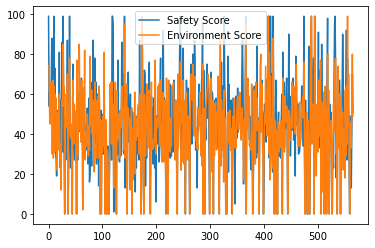

In [24]:
Environ = school_data[['Safety Score','Environment Score']].plot(kind='line')
Environ.plot(figsize=(30,25));

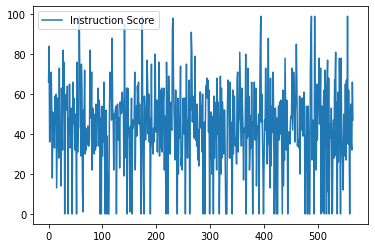

In [25]:
school_data[['Instruction Score','Parent Engagement Score']].plot(kind='line')

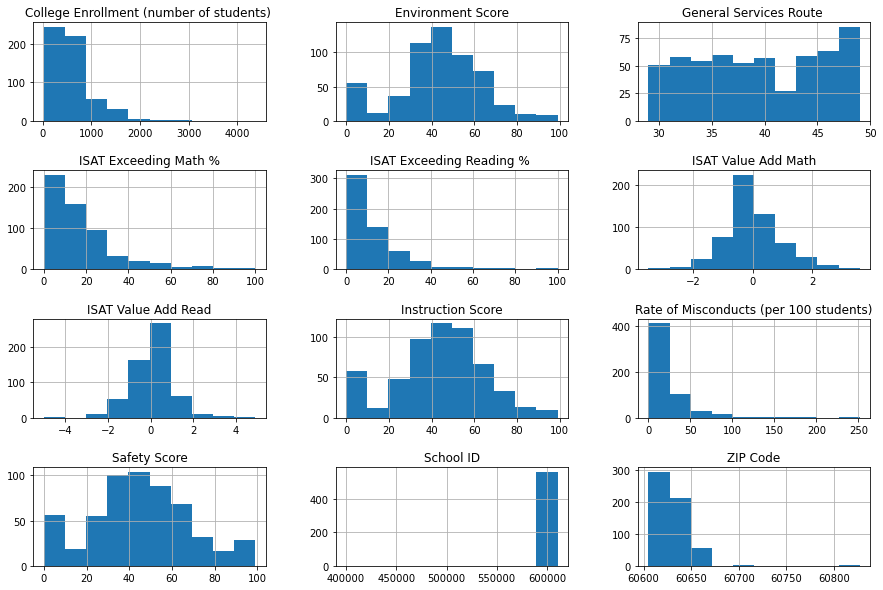

In [26]:
school_data.hist(figsize=(15, 10))
plt.subplots_adjust(hspace=0.5);

In [27]:
instruction_score= school_data['Instruction Score']

In [28]:
school_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 56 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   School ID                                          566 non-null    int64  
 1   Name of School                                     566 non-null    object 
 2   Elementary, Middle, or High School                 566 non-null    object 
 3   Street Address                                     566 non-null    object 
 4   City                                               566 non-null    object 
 5   ZIP Code                                           566 non-null    int64  
 6   Network Manager                                    566 non-null    object 
 7   Collaborative Name                                 566 non-null    object 
 8   Adequate Yearly Progress Made?                     566 non-null    object 
 9   CPS Perfor

In [39]:
school_data['Teachers Score'].astype(float).astype(int)

0      70
1      76
2       0
3      48
4      54
5      50
6       0
7       0
8       0
9      56
10     51
11     41
12     48
13      0
14      0
15     19
16     36
17      0
18      0
19      0
20     54
21     26
22     42
23      0
24     31
25      0
26     50
27     82
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35     47
36      0
37      0
38     70
39      0
40      0
41      0
42      0
43     16
44      0
45     53
46     48
47      0
48     37
49     31
50      0
51     41
52     66
53      0
54      0
55      0
56     15
57     71
58      0
59     55
60     31
61     44
62     32
63      0
64     41
65     50
66     44
67      0
68     54
69      0
70      0
71      0
72     51
73     25
74     32
75     46
76      0
77     19
78     49
79     34
80      0
81      0
82     57
83     40
84      0
85     39
86     62
87     42
88      0
89     59
90     59
91     48
92     72
93      0
94     85
95     31
96     54
97     53
98      0
99      0


In [40]:
school_data['Instruction Score'].astype(float).astype(int)

0      66
1      84
2      36
3      37
4      55
5      71
6      52
7      18
8      51
9      37
10     46
11     33
12     59
13     45
14     60
15     13
16     35
17     58
18     53
19     28
20     73
21     35
22     42
23     14
24     63
25     46
26     32
27     82
28     61
29     76
30      0
31     59
32     54
33     60
34     52
35     64
36      0
37     48
38     40
39     65
40     33
41     34
42     53
43     32
44      0
45     66
46     45
47     58
48     48
49     32
50     50
51     39
52      0
53     76
54     31
55     43
56     43
57     99
58     70
59     72
60     29
61     75
62     63
63     12
64      1
65     52
66     51
67     72
68     30
69     43
70     32
71     40
72     35
73     44
74     34
75     34
76     38
77     82
78     51
79     48
80     71
81     22
82     53
83     47
84     35
85     30
86     50
87     32
88     55
89     34
90     51
91     46
92     63
93     34
94     57
95     52
96      0
97     48
98      0
99     54


In [32]:
average_attendance= school_data['Average Student Attendance']

In [48]:
instruction_score = ['Instruction Score']
average_attendance = ['Teacher Score']
index = ['Name of School']
df = pd.DataFrame({'Instruction_score': [Instruction Score],
                    'Teacher Score': [Average Attendance]}, index=index)
df.plot(x= school_data['Instruction Score'], y = school_data['Teacher Score'])
plt.show()

SyntaxError: invalid syntax (<ipython-input-48-655f82dea1f8>, line 4)

([<matplotlib.axis.XTick at 0x7fa8ff10a5b0>,
 [Text(0, 0, 'Abraham Lincoln Elementary School'),
  Text(0, 0, 'Adam Clayton Powell Paideia Community Academy Elementary School'),
  Text(0, 0, 'Adlai E Stevenson Elementary School'),
  Text(0, 0, 'Agustin Lara Elementary Academy'),
  Text(0, 0, 'Air Force Academy High School'),
  Text(0, 0, 'Albany Park Multicultural Academy'),
  Text(0, 0, 'Albert G Lane Technical High School'),
  Text(0, 0, 'Albert R Sabin Elementary Magnet School'),
  Text(0, 0, 'Alcott High School for the Humanities'),
  Text(0, 0, 'Alessandro Volta Elementary School'),
  Text(0, 0, 'Alexander Graham Bell Elementary School'),
  Text(0, 0, 'Alexander Graham Elementary School'),
  Text(0, 0, 'Alexander Hamilton Elementary School'),
  Text(0, 0, 'Alexander von Humboldt Elementary School'),
  Text(0, 0, 'Alex Haley Elementary Academy'),
  Text(0, 0, 'Alfred David Kohn Elementary School'),
  Text(0, 0, 'Alfred Nobel Elementary School'),
  Text(0, 0, 'Alice L Barnard Compute

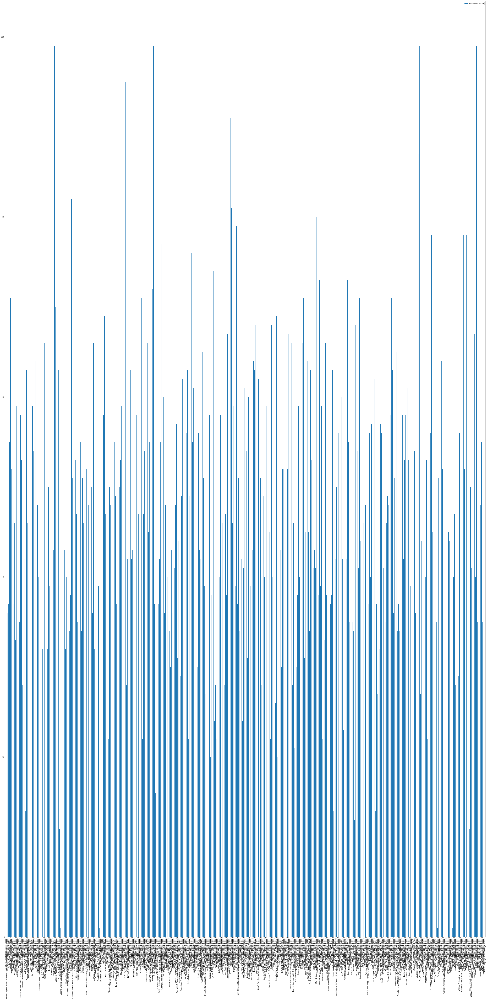

In [57]:
school_data.plot.bar(y='Instruction Score', figsize=(50,100))
plt.xticks(school_data.index, school_data['Name of School'], rotation=90)

In [ ]:

datapath = '/Users/krystalosei/Downloads/chigago_schools_progress_reports.csv'
if not os.path.exists(datapath):
    os.mkdir(datapath)

In [ ]:
school_data.to_csv('school_data.csv',index=False)

In [ ]:
import os

Save Data